<a href="https://colab.research.google.com/github/ash-netizen/datascience/blob/master/Work_Life_Integration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

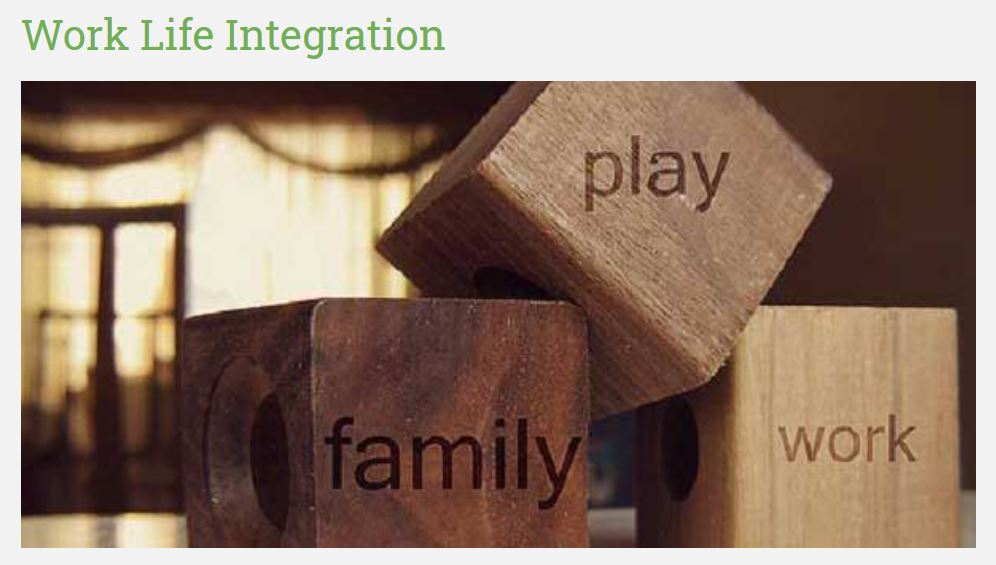

# **Work Life Integration**

According to a global survey, about 450 million people live with mental disorders, including anxiety, depression, that can be one of the primary causes of poor health, stress and disability worldwide. In the current virtual scenario, it becomes very crucial for employers to know the mental health of their employees as this directly impacts productivity of the company or workflow and also influences team and workplace culture. To assess and understand the situation across the company, a survey was rolled out to the employees of XyX corporation last year. The responses to the survey are provided along with the ‘mental fatigue’ score which was computed for each employee.

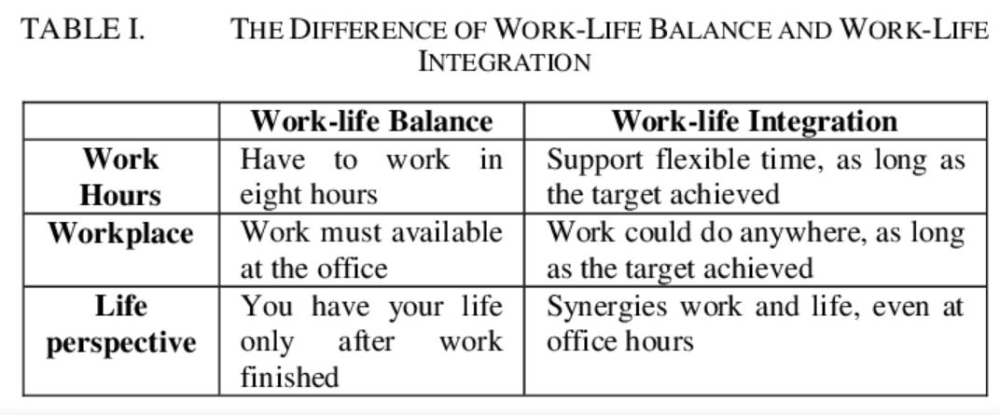

#                                                                            **Task**

we need to review survey results of last year and the ‘Mental fatigue score’ computed for each employee. This data is provided to us in the form of train.csv. We want to understand and observe the change in mental health parameters of all the employees in the XyX corporation. Therefore, we want to predict the mental fatigue score of employees this year based on the provided features and helping XyX corporation to take appropriate corrective steps for their employees.

# **Lets import few necessary Packages**

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as st
import matplotlib.pyplot as plt
from matplotlib.pyplot import xticks

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import os

#Hide warnings

import warnings
warnings.filterwarnings('ignore')



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
from google.colab import files
files.upload()

Saving test.csv to test.csv


{'test.csv': b'Employee ID,Date of Joining,Gender,Company Type,WFH Setup Available,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score\nfffe31003300390039003000,2008-12-10,Female,Service,No,39,14,4,2,5,7.7\nfffe31003300310037003800,2008-08-14,Female,Product,Yes,51,9,4,1,2,5.2\nfffe33003400380035003900,2008-11-13,Male,Product,Yes,30,5,8,1,3,5.9\nfffe3100370039003200,2008-02-07,Female,Service,No,22,5,6,3,6,4.6\nfffe32003600390036003700,2008-07-17,Female,Product,No,62,10,3,2,5,6.4\nfffe3600390032003200,2008-09-19,Male,Product,No,63,10,5,3,5,6.5\nfffe3600370032003200,2008-01-16,Female,Service,Yes,58,19,2,2,3,4.7\nfffe32003900390030003000,2008-02-10,Male,Service,No,38,9,1,2,5,8.5\nfffe3100370031003000,2008-08-10,Male,Product,Yes,59,7,5,2,5,7.6\nfffe31003500320037003600,2008-05-20,Male,Product,Yes,49,18,6,2,5,5.7\nfffe3400370031003100,2008-12-17,Male,Service,Yes,32,5,9,2,5,5.2\nfffe32003800300035003300,2008-03-26,Female,Service,Yes,22,8,2,2,5,4.4\n

In [155]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [215]:
test = pd.read_csv("test.csv")

## **Lets create Visulalization Report leveraging Pandas Profiling Library**

In [ ]:
!pip install pandas-profiling



In [ ]:
#using profiling library to initiate data cleaning and get an overview
import pandas_profiling as pp
from pandas_profiling import ProfileReport
profile = ProfileReport(train, title="Pandas Profiling Report")


In [ ]:
profile.to_widgets()


/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:424: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("your_report.html")


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
!pwd

/content


In [55]:
train.isnull().sum()

Employee ID                        0
Date of Joining                    0
Gender                             0
Company Type                       0
WFH Setup Available                0
Age                                0
Tenure                             0
Vacations taken                    0
Designation                        0
Average Hours worked per day    1381
Employee satisfaction score     2117
Mental Fatigue Score            1011
dtype: int64

In [5]:
train = train.dropna()

In [54]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22750 entries, 0 to 22749
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Employee ID                   22750 non-null  object 
 1   Date of Joining               22750 non-null  object 
 2   Gender                        22750 non-null  object 
 3   Company Type                  22750 non-null  object 
 4   WFH Setup Available           22750 non-null  object 
 5   Age                           22750 non-null  int64  
 6   Tenure                        22750 non-null  int64  
 7   Vacations taken               22750 non-null  int64  
 8   Designation                   22750 non-null  int64  
 9   Average Hours worked per day  21369 non-null  float64
 10  Employee satisfaction score   20633 non-null  float64
 11  Mental Fatigue Score          21739 non-null  float64
dtypes: float64(3), int64(4), object(5)
memory usage: 2.1+ MB


In [122]:
# number of unique values per Feature
train.nunique()

Employee ID                     18670
Date of Joining                   366
Gender                              2
Company Type                        2
WFH Setup Available                 2
Age                                45
Tenure                             20
Vacations taken                    13
Designation                         6
Average Hours worked per day       10
Employee satisfaction score       101
Mental Fatigue Score              101
dtype: int64

In [ ]:
train.describe()

,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score
count,22750.000000,22750.000000,22750.000000,22750.000000,21369.000000,20633.000000,21739.000000
mean,43.036967,10.499516,5.955341,2.178725,4.481398,5.728188,0.449656
std,12.931466,5.776066,3.736712,1.135145,2.047211,1.920839,0.200365
min,21.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,32.000000,5.000000,3.000000,1.000000,3.000000,4.600000,0.310000
50%,43.000000,10.000000,6.000000,2.000000,4.000000,5.900000,0.450000
75%,54.000000,16.000000,9.000000,3.000000,6.000000,7.100000,0.590000
max,65.000000,20.000000,12.000000,5.000000,10.000000,10.000000,1.000000


## Processing the Categorical Variables

In [55]:
train.head(1)

,Employee ID,Date of Joining,Gender,Company Type,WFH Setup Available,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score
0,fffe32003000360033003200,2008-09-30,Female,Service,No,52,18,8,2,3.0,3.8,0.16


in above Frame we can see that we have below variables as Categorical in our Dataset so we will convert these to Binary Values by **One Hot Encoding**


*   Gender
*   Company Type
* WFH Setup Available


In [156]:
is_male = pd.get_dummies(train.Gender, drop_first = True)
is_product = pd.get_dummies(train["Company Type"], drop_first = True)
is_wfh_available = pd.get_dummies(train["WFH Setup Available"], drop_first = True)

dummy1 = pd.get_dummies(train[['Company Type', 'WFH Setup Available', 'Gender']], drop_first=True)
dummy1.head()

# Adding the results to the original dataset
df = pd.concat([train, dummy1], axis=1)
df.head()
#dropping Original Categorical Variables
df = df.drop(['Gender', 'Company Type', 'WFH Setup Available'], axis = 1 )

df.head()

,Employee ID,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,fffe32003000360033003200,2008-09-30,52,18,8,2,3.0,3.8,0.16,1,0,0
1,fffe3700360033003500,2008-11-30,26,12,4,1,2.0,5.0,0.36,1,1,1
2,fffe31003300320037003900,2008-03-10,63,20,4,2,NaN,5.8,0.49,0,1,0
3,fffe32003400380032003900,2008-11-03,59,20,12,1,1.0,2.6,0.20,1,1,1
4,fffe31003900340031003600,2008-07-24,63,10,9,3,7.0,6.9,0.52,1,0,0


# **Null Value Treatment**

In [157]:
# Checking the percentage of missing values
round(100*(df.isnull().sum()/len(df.index)), 2)

Employee ID                     0.00
Date of Joining                 0.00
Age                             0.00
Tenure                          0.00
Vacations taken                 0.00
Designation                     0.00
Average Hours worked per day    6.07
Employee satisfaction score     9.31
Mental Fatigue Score            4.44
Company Type_Service            0.00
WFH Setup Available_Yes         0.00
Gender_Male                     0.00
dtype: float64

In [158]:
df = df.dropna()

**Lets see the Distribution of the Features having missing Values**

Lets treat **Average Hours worked per day**

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

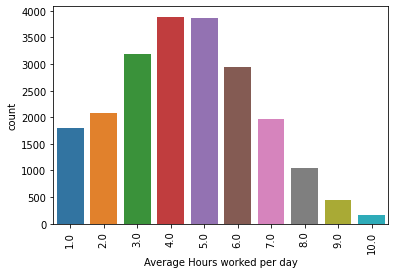

In [ ]:
sns.countplot(df['Average Hours worked per day'])
xticks(rotation = 90)

In [ ]:
df['Average Hours worked per day'].value_counts()

4.0     3893
5.0     3861
3.0     3192
6.0     2943
2.0     2075
7.0     1965
1.0     1791
8.0     1044
9.0      446
10.0     159
Name: Average Hours worked per day, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a975e90>]],
      dtype=object)

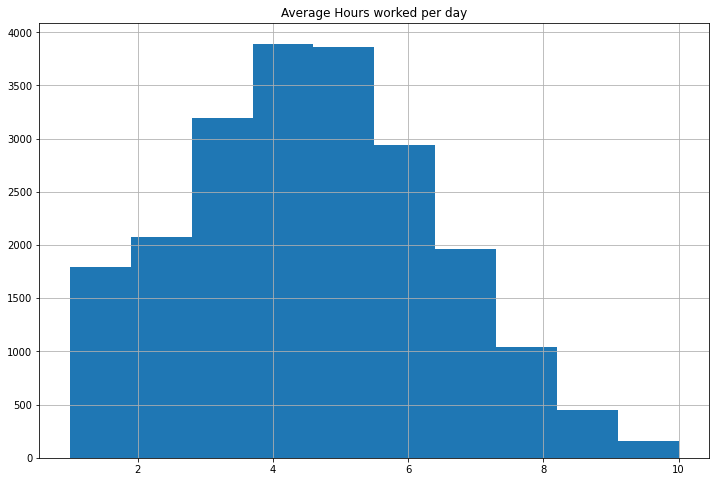

In [ ]:
df.hist('Average Hours worked per day', bins=10, figsize=(12,8))




/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


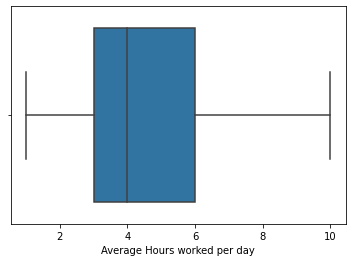

In [ ]:
sns.boxplot(df['Average Hours worked per day'])


we can impute null values for **Average Hours worked per day** with **Median** as its bit skewed.


In [110]:
df['Average Hours worked per day'].fillna(df['Average Hours worked per day'].median(), inplace=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a837dd0>]],
      dtype=object)

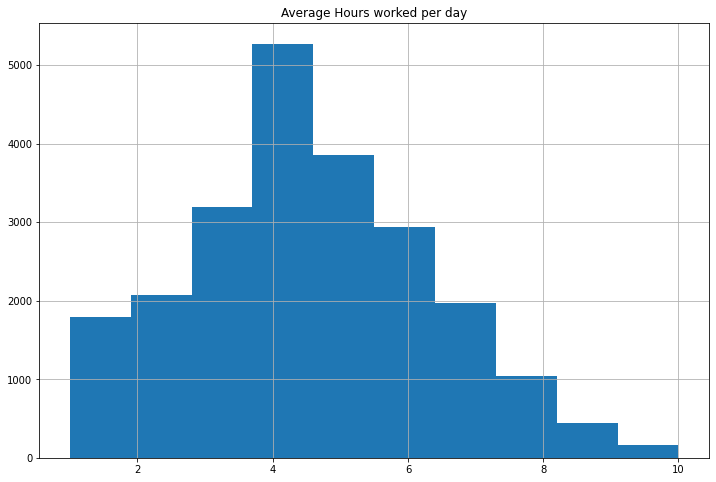

In [ ]:
df.hist('Average Hours worked per day', bins=10, figsize=(12,8))


Lets treat **Employee satisfaction score**

In [ ]:

df['Employee satisfaction score'].value_counts()

6.0    470
5.8    464
5.9    458
6.1    457
6.3    454
      ... 
0.5     24
0.2     23
0.4     19
0.1     17
0.3     13
Name: Employee satisfaction score, Length: 101, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


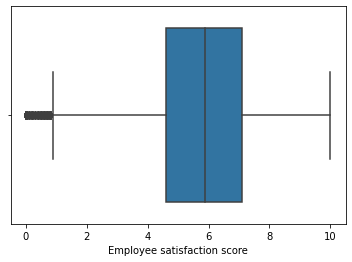

In [ ]:
sns.boxplot(df['Employee satisfaction score'])


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a74a7d0>]],
      dtype=object)

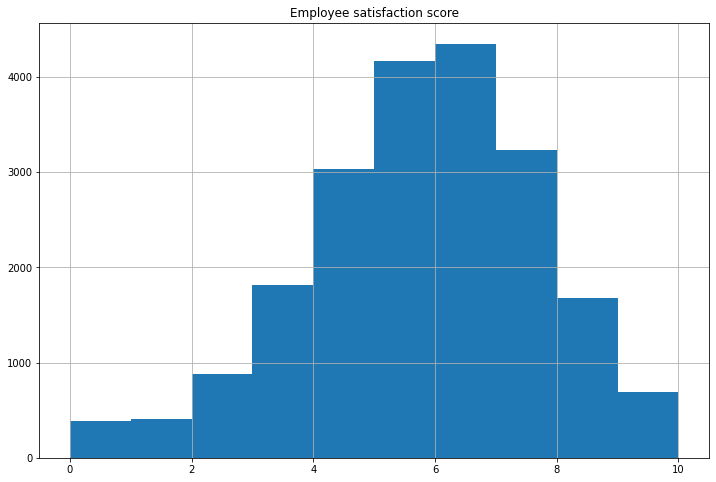

In [ ]:
df.hist('Employee satisfaction score', bins=10, figsize=(12,8))


we can impute null values for Employee Satisfaction Score with Median as its bit skewed.

In [111]:
df['Employee satisfaction score'].fillna(df['Employee satisfaction score'].median(), inplace=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a68e390>]],
      dtype=object)

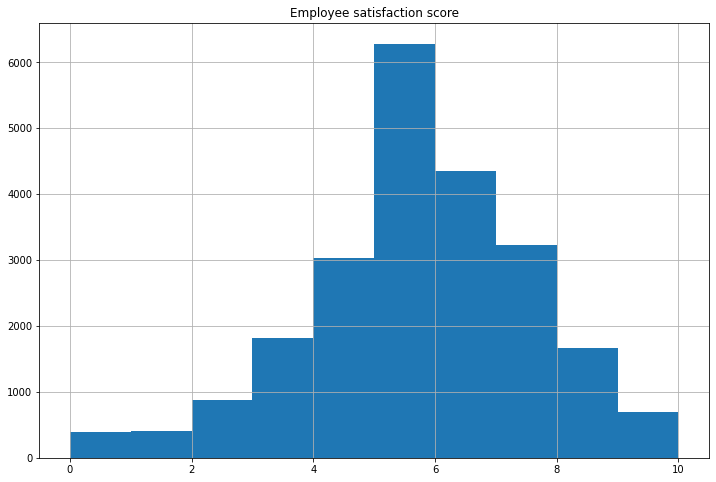

In [ ]:
df.hist('Employee satisfaction score', bins=10, figsize=(12,8))


Lets handle **Mental Fatigue Score**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a61f510>]],
      dtype=object)

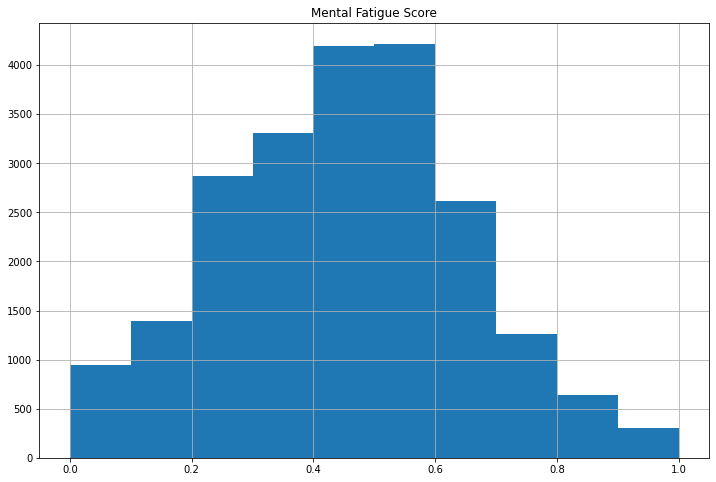

In [ ]:
df.hist('Mental Fatigue Score', bins=10, figsize=(12,8))


having above histogram observed lets impute **Mental Fatigue Score** with **Mode**

In [112]:
#having observed above histogram lets impute Fatigue Score with Mode
df['Mental Fatigue Score'].fillna(df['Mental Fatigue Score'].median(), inplace=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe51a5a8750>]],
      dtype=object)

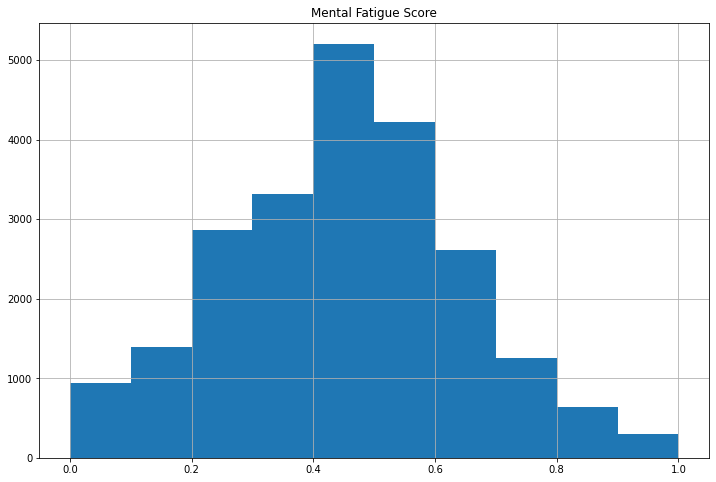

In [ ]:
df.hist('Mental Fatigue Score', bins=10, figsize=(12,8))


Lets put **Employee satisfaction score** in few Bins for better visualization

In [ ]:
df['Status'] =  pd.qcut(df['Employee satisfaction score'], 4, labels=['Very Dissatisfied', 'Somehow Satisfied', 'Satisfied', 'Very Satisfied'])
df[['Employee satisfaction score', 'Status']].head(10) 


,Employee satisfaction score,Status
0,3.8,Very Dissatisfied
1,5.0,Somehow Satisfied
2,5.8,Somehow Satisfied
3,2.6,Very Dissatisfied
4,6.9,Satisfied
5,3.6,Very Dissatisfied
6,7.9,Very Satisfied
7,4.4,Very Dissatisfied
8,5.9,Somehow Satisfied
9,5.9,Somehow Satisfied


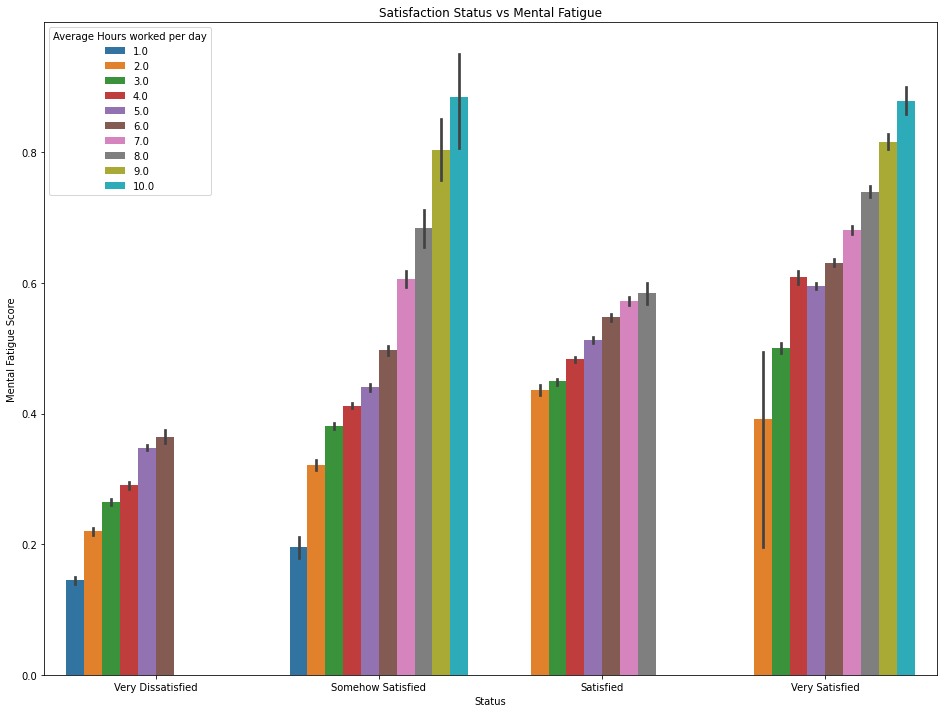

In [ ]:
#Bivariate analysis with 'Mental Fatigue Score'
plt.figure(figsize=(16,12))
sns.barplot(data =df, x='Status', y='Mental Fatigue Score', hue = 'Average Hours worked per day')
plt.title('Satisfaction Status vs Mental Fatigue')
plt.show()

**Key Inferences:**

1. Employees who are very dissatisfied dont work more than 6 Hours avg in a day 
and so have very less Mental Fatigue as well.

2. for less Satisfied employees Mental Fatgue is directly proportional to Average Hours worked per day.

3. There is an interesting finding here is employees who are **Satisfied** with their Job work 7-8 Hours and thus also have very less Mental Fatigue.


Lets make bins for Age 

In [ ]:
df['Age Bracket'] =  pd.qcut(df['Age'], 4, labels=['Young', 'Adult', 'Mid-Aged', 'Old'])
df[['Age', 'Age Bracket']].head(10) 

,Age,Age Bracket
0,52,Mid-Aged
1,26,Young
2,63,Old
3,59,Old
4,63,Old
5,44,Mid-Aged
6,62,Old
7,31,Young
8,23,Young
9,27,Young


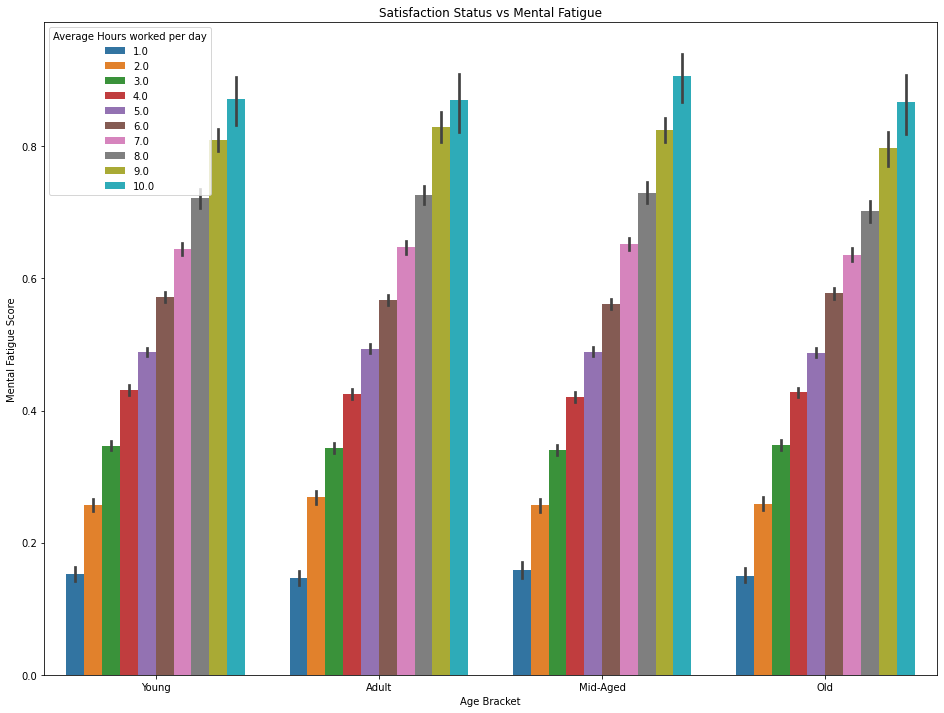

In [ ]:
#Bivariate analysis with 'Mental Fatigue Score'
plt.figure(figsize=(16,12))
sns.barplot(data =df, x='Age Bracket', y='Mental Fatigue Score', hue = 'Average Hours worked per day')
plt.title('Satisfaction Status vs Mental Fatigue')
plt.show()

**Key Inference:**

Mental Fatigue Score has same Pattern for all Age Groups directly proportional to Average Hours worked per day.

Lets make Bins for **Tenure** as well

In [ ]:
df['Tenure Bracket'] =  pd.qcut(df['Tenure'], 4, labels=['Novice', 'Contributor', 'Expert', 'Master'])
df[['Tenure', 'Tenure Bracket']].head(10) 

,Tenure,Tenure Bracket
0,18,Master
1,12,Expert
2,20,Master
3,20,Master
4,10,Contributor
5,8,Contributor
6,16,Expert
7,16,Expert
8,15,Expert
9,1,Novice


In [ ]:
df.head(2)

,Employee ID,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male,Status,Age Bracket,Tenure Bracket
0,fffe32003000360033003200,2008-09-30,52,18,8,2,3.0,3.8,0.16,1,0,0,Very Dissatisfied,Mid-Aged,Master
1,fffe3700360033003500,2008-11-30,26,12,4,1,2.0,5.0,0.36,1,1,1,Somehow Satisfied,Young,Expert


Lets bucketize **Mental Fatigue Score**.

In [ ]:
df['Mental Status'] =  pd.qcut(df['Mental Fatigue Score'], 4, labels=['Relaxed', 'Healthy', 'Anxious', 'Panic'])
df[['Mental Fatigue Score', 'Mental Status']].head(10) 

,Mental Fatigue Score,Mental Status
0,0.16,Relaxed
1,0.36,Healthy
2,0.49,Anxious
3,0.20,Relaxed
4,0.52,Anxious
5,0.29,Relaxed
6,0.62,Panic
7,0.33,Healthy
8,0.56,Anxious
9,0.67,Panic


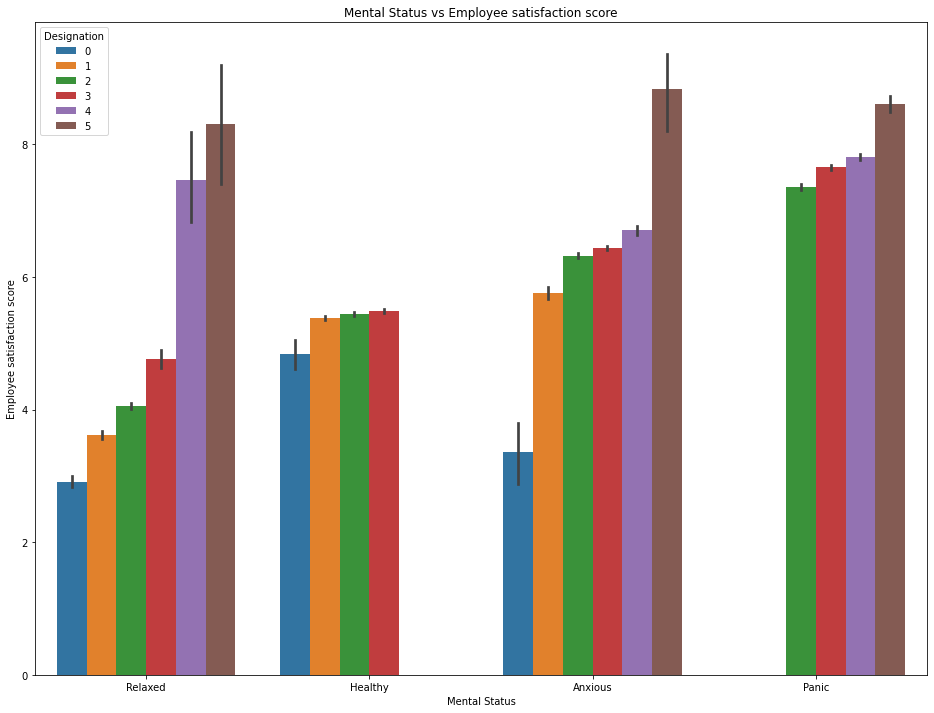

In [ ]:
#Bivariate analysis with 'Mental Fatigue Score'
plt.figure(figsize=(16,12))
sns.barplot(data =df, x='Mental Status', y='Employee satisfaction score', hue = 'Designation')
plt.title('Mental Status vs Employee satisfaction score')
plt.show()

**Key Inference:**

1. higher the Designation, higher the Employee Satisfaction Score, higher the Stress.
2. we have no one in Panic State with 0 designation.
3. no one in Healthy Mental State with Designation 4 and 5.



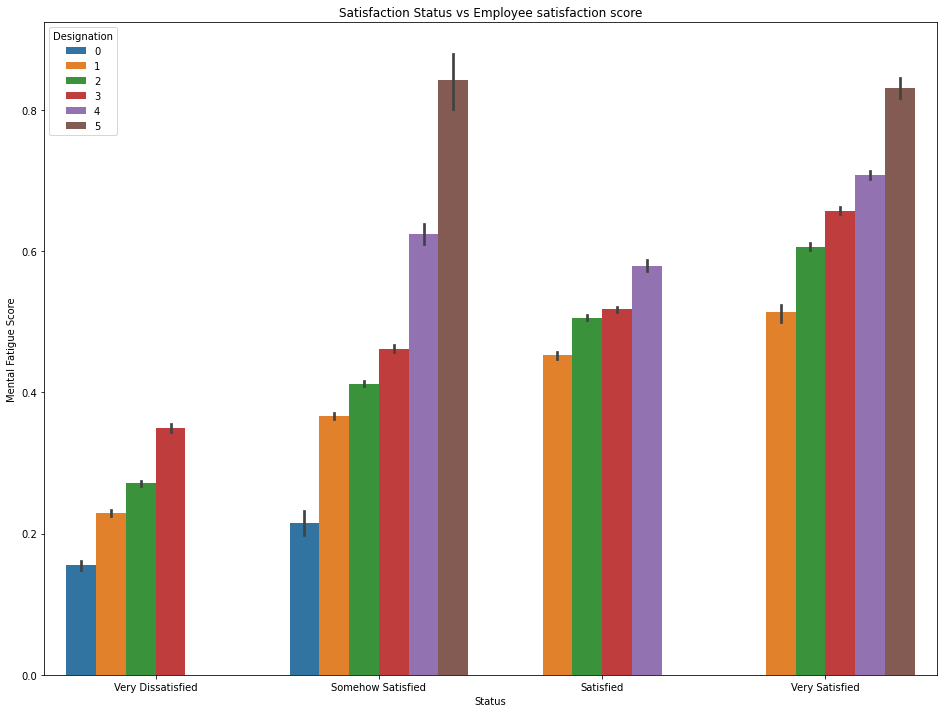

In [ ]:
#Bivariate analysis with 'Mental Fatigue Score'
plt.figure(figsize=(16,12))
sns.barplot(data =df, x='Status', y='Mental Fatigue Score', hue = 'Designation')
plt.title('Satisfaction Status vs Employee satisfaction score')
plt.show()

1. There is no one Satisfied with Designation 5. either they are less Satisfied or very Satisfied.
2. no one with Designation 5 is very dissatisfied.
3. higher the designation, higher the Mental Fatigue Score which is obvious.

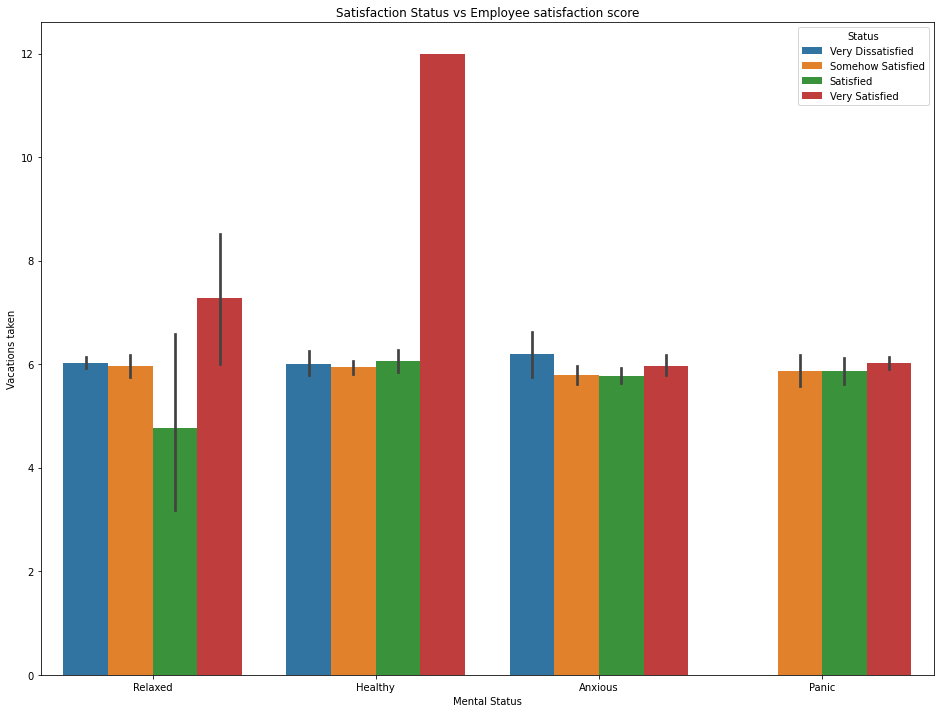

In [ ]:
#Bivariate analysis with 'Mental Fatigue Score'
plt.figure(figsize=(16,12))
sns.barplot(data =df, x='Mental Status', y='Vacations taken', hue = 'Status')
plt.title('Satisfaction Status vs Employee satisfaction score')
plt.show()

**Key Inferences**

#More Vacations, less Mental Fatigue

1. Employees who are very much satisfied with their Job are the ones who take 12 vacations and thus they are also in Mentally Healthy State.

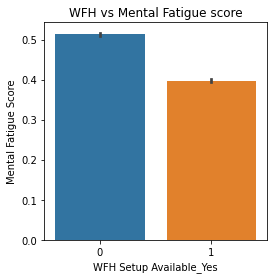

In [ ]:
plt.figure(figsize=(4,4))
sns.barplot(data =df, x='WFH Setup Available_Yes', y='Mental Fatigue Score')
plt.title('WFH vs Mental Fatigue score')
plt.show()

less Mental Fatigue while doing WFH.

In [12]:
df.head(5)

,Employee ID,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,fffe32003000360033003200,300,52,18,8,2,3.0,3.8,0.16,1,0,0
1,fffe3700360033003500,360,26,12,4,1,2.0,5.0,0.36,1,1,1
3,fffe32003400380032003900,2008-11-03,59,20,12,1,1.0,2.6,0.20,1,1,1
4,fffe31003900340031003600,2008-07-24,63,10,9,3,7.0,6.9,0.52,1,0,0
5,fffe3300350037003500,2008-11-26,44,8,10,2,4.0,3.6,0.29,0,1,1


In [ ]:
df1 = df.drop(['Status', 'Age Bracket', 'Tenure Bracket', 'Mental Status'], axis = 1)

In [107]:
df.head(2)

,Employee ID,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,fffe32003000360033003200,300,52,18,8,2,3.0,3.8,0.16,1,0,0
1,fffe3700360033003500,360,26,12,4,1,2.0,5.0,0.36,1,1,1


The Column: "**Date of Joining**"
All the employees in the dataset seem to join in 2008. Thus, omiting the year and converting the dates to integers (just to days) might help us a bit along the way. Here what we are going to do is

In [113]:
import time
# starting time
start = time.time()

month_dict = {"01":31, "02":29, "03":31, 
              "04":30, "05":31, "06":30, 
              "07":31, "08":31, "09":30, 
              "10":31, "11":30, "12":31}

for dataset in (df, test):
    for i in range(len(dataset)):
        x = dataset["Date of Joining"][i].split("-")    # sample output: ['2008', '09', '30']
        x = eval(f"{int(x[1])} * {month_dict[x[1]]} + {int(x[2])}")    # sample output: 300
        dataset.loc[i, "Date of Joining"] = x

    dataset["Date of Joining"] = dataset["Date of Joining"].astype("float32")
    dataset["Date of Joining"] = abs(dataset["Date of Joining"] - dataset["Date of Joining"].max())
    dataset["Date of Joining"] /= dataset["Date of Joining"].max()

end = time.time()

# total time taken
print(f"Runtime of the program is {end - start}")

Runtime of the program is 21.388962030410767


In [61]:
df['Date of Joining']

0        0.277628
1        0.115903
2        0.808625
3        0.188679
4        0.436658
           ...   
22745    0.002695
22746    0.951482
22747    0.183288
22748    0.975741
22749    0.986523
Name: Date of Joining, Length: 22750, dtype: float64

In [159]:
df = df.drop(['Employee ID'],axis = 1)

creating dummies for Test set

In [225]:
is_male = pd.get_dummies(test.Gender, drop_first = True)
is_product = pd.get_dummies(test["Company Type"], drop_first = True)
is_wfh_available = pd.get_dummies(test["WFH Setup Available"], drop_first = True)


dummy1 = pd.get_dummies(test[['Company Type', 'WFH Setup Available', 'Gender']], drop_first=True)

# Adding the results to the original dataset
test = pd.concat([test, dummy1], axis=1)
#dropping Original Categorical Variables
test = test.drop(['Gender', 'Company Type', 'WFH Setup Available'], axis = 1 )

# Train - Validation Set splitting

In [116]:
# Split the datafram into train and test sets
from sklearn.model_selection import train_test_split
df_train, df_val = train_test_split(df, train_size=0.8, test_size=0.2, random_state=100)

# **Feature Scaling**

Now that we have done the test-train split, we need to scale the variables for better interpretability. But we only need the scale the numeric columns and not the dummy variables. Let's take a look at the list of numeric variables we had created in the beginning. Also, the scaling has to be done only on the train dataset as you don't want it to learn anything from the vakidation or test data.

In [ ]:
df.columns

Index(['Date of Joining', 'Age', 'Tenure', 'Vacations taken', 'Designation',
       'Average Hours worked per day', 'Employee satisfaction score',
       'Mental Fatigue Score', 'Company Type_Service',
       'WFH Setup Available_Yes', 'Gender_Male'],
      dtype='object')

In [117]:

from sklearn import preprocessing

# Create a scaling object
min_max_scaler = preprocessing.MinMaxScaler()

# Create a list of the variables that you need to scale
varlist = ['Date of Joining', 'Age', 'Tenure', 'Vacations taken', 'Designation',
       'Average Hours worked per day', 'Employee satisfaction score']

# Scale these variables using 'fit_transform'
df[varlist] = min_max_scaler.fit_transform(df[varlist])

In [118]:
# Let's take a look at the train dataframe now
df.head()

,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,0.277628,0.704545,0.894737,0.666667,0.4,0.222222,0.38,0.16,1,0,0
1,0.115903,0.113636,0.578947,0.333333,0.2,0.111111,0.50,0.36,1,1,1
2,0.808625,0.954545,1.000000,0.333333,0.4,0.333333,0.58,0.49,0,1,0
3,0.188679,0.863636,1.000000,1.000000,0.2,0.000000,0.26,0.20,1,1,1
4,0.436658,0.954545,0.473684,0.750000,0.6,0.666667,0.69,0.52,1,0,0


**As expected, the variables have been appropriately scaled.**

In [119]:
# Split the train dataset into X and y

y_train = df_train.pop('Mental Fatigue Score')
X_train = df_train

In [120]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train,y_train)
# Print the coefficients and intercept
print(lm.coef_)
print(lm.intercept_)

[ 2.46611497e-03 -1.57092332e-05  6.82876983e-05 -1.00669453e-04
  7.27922792e-03  3.05773229e-02  6.39848778e-02  1.69272455e-03
 -1.58220973e-02  6.34887964e-03]
-0.06601511045741054


In [121]:
## Invoking Functions to Build Model and  to Check VIF

def build_model(X,y):
    X = sm.add_constant(X) #to add constant
    lm = sm.OLS(y,X).fit() # fitting the model
    print(lm.summary()) # model summary
    return X
    
def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [122]:
x_train_new = build_model(X_train,y_train)

                             OLS Regression Results                             
Dep. Variable:     Mental Fatigue Score   R-squared:                       0.809
Model:                              OLS   Adj. R-squared:                  0.809
Method:                   Least Squares   F-statistic:                     7695.
Date:                  Tue, 20 Apr 2021   Prob (F-statistic):               0.00
Time:                          16:48:19   Log-Likelihood:                 18856.
No. Observations:                 18200   AIC:                        -3.769e+04
Df Residuals:                     18189   BIC:                        -3.761e+04
Df Model:                            10                                         
Covariance Type:              nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [71]:
#Calculating the Variance Inflation Factor
checkVIF(x_train_new)

,Features,VIF
0,const,37.06
6,Average Hours worked per day,4.65
5,Designation,3.67
7,Employee satisfaction score,2.26
9,WFH Setup Available_Yes,1.09
10,Gender_Male,1.02
1,Date of Joining,1.00
2,Age,1.00
3,Tenure,1.00
4,Vacations taken,1.00


In [123]:
#dropping these variables due to its high p-value
x_train_new = x_train_new.drop(["Age", "Tenure", "Vacations taken"], axis = 1)

In [124]:
x_train_new = build_model(x_train_new,y_train)

                             OLS Regression Results                             
Dep. Variable:     Mental Fatigue Score   R-squared:                       0.809
Model:                              OLS   Adj. R-squared:                  0.809
Method:                   Least Squares   F-statistic:                 1.099e+04
Date:                  Tue, 20 Apr 2021   Prob (F-statistic):               0.00
Time:                          16:48:41   Log-Likelihood:                 18856.
No. Observations:                 18200   AIC:                        -3.770e+04
Df Residuals:                     18192   BIC:                        -3.763e+04
Df Model:                             7                                         
Covariance Type:              nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [74]:
checkVIF(x_train_new)

,Features,VIF
0,const,20.13
3,Average Hours worked per day,4.65
2,Designation,3.67
4,Employee satisfaction score,2.26
6,WFH Setup Available_Yes,1.09
7,Gender_Male,1.02
1,Date of Joining,1.00
5,Company Type_Service,1.00


# **Residual Analysis**

In [125]:
lm = sm.OLS(y_train,x_train_new).fit()
y_train_stress = lm.predict(x_train_new)

Text(0.5, 0, 'Errors')

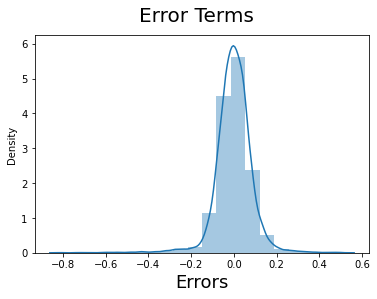

In [126]:
# Plotting the histogram of the error terms

fig = plt.figure()
sns.distplot((y_train - y_train_stress), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  
plt.xlabel('Errors', fontsize = 18)

As we can see Error terms are approximately normally distributed so our assumptions are satisfied.

# **Prediction and Evaluation**

In [127]:
#Dividing into X and y

y_val = df_val.pop('Mental Fatigue Score')


In [128]:
x_val = df_val

In [129]:
# # Now let's use our model to make predictions.

x_train_new = x_train_new.drop('const',axis=1)

In [130]:
# Creating X_test_new dataframe by dropping variables from X_test
x_val_new = x_val[x_train_new.columns]

In [131]:
# Adding a constant variable 
x_val_new = sm.add_constant(x_val_new)

In [132]:
y_pred = lm.predict(x_val_new)

In [133]:
from sklearn.metrics import r2_score
r2_score(y_val, y_pred)


0.8083304908955112

# **Model Evaluation**

Text(0, 0.5, 'y_pred')

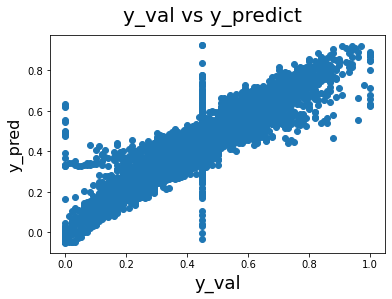

In [134]:
#Let's now plot the graph for actual versus predicted values.
# Plotting y_val and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_val,y_pred)
fig.suptitle('y_val vs y_predict', fontsize=20)              # Plotting heading 
plt.xlabel('y_val', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [135]:
print(lm.summary())

                             OLS Regression Results                             
Dep. Variable:     Mental Fatigue Score   R-squared:                       0.809
Model:                              OLS   Adj. R-squared:                  0.809
Method:                   Least Squares   F-statistic:                 1.099e+04
Date:                  Tue, 20 Apr 2021   Prob (F-statistic):               0.00
Time:                          16:50:10   Log-Likelihood:                 18856.
No. Observations:                 18200   AIC:                        -3.770e+04
Df Residuals:                     18192   BIC:                        -3.763e+04
Df Model:                             7                                         
Covariance Type:              nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

# **Equation of best fit line**

**Mental Fatigue Score** = 0.0362 x **Designation** + 0.2732 x **Average Hours worked per day** + 0.6439 x **Employee satisfaction score** - 0.0167 x **WFH Setup Available_Yes** + 0.0063 x **Gender_Male** + 0.034

**Lets do predictions on our Test Set**

In [220]:
test.head()

,Date of Joining,Gender,Company Type,WFH Setup Available,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score
0,2008-12-10,Female,Service,No,39,14,4,2,5,7.7
1,2008-08-14,Female,Product,Yes,51,9,4,1,2,5.2
2,2008-11-13,Male,Product,Yes,30,5,8,1,3,5.9
3,2008-02-07,Female,Service,No,22,5,6,3,6,4.6
4,2008-07-17,Female,Product,No,62,10,3,2,5,6.4


In [221]:
test = test.drop(['Date of Joining'], axis=1)

Applying the scaling on the Test set

In [222]:
#Scaling the Validation set
num_vars = ['Age', 'Tenure', 'Vacations taken', 'Designation',
       'Average Hours worked per day', 'Employee satisfaction score']
test[num_vars] = min_max_scaler.fit_transform(test[num_vars])

In [91]:
x_test = test

In [92]:
## Creating X_test_new dataframe by dropping variables from X_test
x_test_new = x_test[x_train_new.columns]

In [93]:
# Adding a constant variable 
x_test_new = sm.add_constant(x_test_new)

In [95]:
y_pred = lm.predict(x_test_new)

In [96]:
y_pred

0        0.001021
1       -0.043349
2       -0.029652
3       -0.011855
4       -0.008015
           ...   
12245   -0.036221
12246   -0.029702
12247    0.031317
12248    0.007948
12249   -0.046487
Length: 12250, dtype: float64

In [139]:
sub = pd.read_csv("test.csv")
sub = sub.loc[:, ["Employee ID"]]

In [140]:
sub.head()

,Employee ID
0,fffe31003300390039003000
1,fffe31003300310037003800
2,fffe33003400380035003900
3,fffe3100370039003200
4,fffe32003600390036003700


In [ ]:
sub['Mental Fatigue Score'] = y_pred

In [ ]:
sub.to_csv('submission.csv', index = False)

In [ ]:
# download file
from google.colab import files
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Lets try some more Complex Models**

In [44]:
!pip3 install catboost


     |████████████████████████████████| 67.3MB 56kB/s 


In [149]:
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.ensemble import StackingRegressor
from sklearn.model_selection import RandomizedSearchCV

import xgboost
import lightgbm as lgb


from sklearn.metrics import r2_score

In [99]:
def print_r2_score(y_train, train_pred, y_test, test_pred):
    r2_train = r2_score(y_train, train_pred)
    print("Score LR Train: "+str(round(100*r2_train, 4))+" %")

    r2_test = r2_score(y_test, test_pred)
    print("Score LR Test: "+str(round(100*r2_test, 4))+" %")

# **Ridge**

In [ ]:
ridge_model = Ridge()
ridge_model.fit(X_train, y_train)

train_pred_ridge = ridge_model.predict(X_train)
test_pred_ridge = ridge_model.predict(x_val)
print_r2_score(y_train, train_pred_ridge, y_val, test_pred_ridge)

ridge_main_pred = ridge_model.predict(test)

sub["Mental Fatigue Score"] = ridge_main_pred
sub.to_csv('submission_Ridge.csv', index=False)
# download file
from google.colab import files
files.download('submission_Ridge.csv')

Score LR Train: 81.0312 %
Score LR Test: 80.2991 %


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Lasso**

In [ ]:
lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)

train_pred_lasso = lasso_model.predict(X_train)
test_pred_lasso = lasso_model.predict(x_val)
print_r2_score(y_train, train_pred_lasso, y_val, test_pred_lasso)

lasso_main_pred = lasso_model.predict(test)

sub["Mental Fatigue Score"] = lasso_main_pred 
sub.to_csv('submission_Lasso.csv', index=False)

Score LR Train: 0.0 %
Score LR Test: -0.0078 %


# **Random Forest Regression**

In [145]:
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

train_pred_rf = rf_model.predict(X_train)
test_pred_rf = rf_model.predict(x_val)
print_r2_score(y_train, train_pred_rf, y_val, test_pred_rf)

rf_main_pred = rf_model.predict(test)

sub["Mental Fatigue Score"] = rf_main_pred
sub.to_csv('submission_rf.csv', index=False)

# download file
from google.colab import files
files.download('submission_rf.csv')

Score LR Train: 97.2539 %
Score LR Test: 80.6392 %


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [100]:
X_train.head()

,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
4079,0.433962,59,6,12,2,3.0,5.9,1,1,1
10983,0.167116,23,15,10,2,3.0,4.0,1,0,0
8265,0.156334,48,9,2,2,3.0,4.9,1,1,1
9202,0.123989,43,3,11,3,6.0,6.0,1,0,1
18933,0.878706,61,10,3,2,3.0,3.6,1,1,0


In [141]:
X_train = X_train.drop(['Age', 'Tenure', 'Vacations taken'], axis = 1)

In [142]:
test = test.drop(['Age', 'Tenure', 'Vacations taken'], axis = 1)

In [143]:
x_val = x_val.drop(['Age', 'Tenure', 'Vacations taken'], axis = 1)

# **XGB (with tuning)**

In [106]:
params = {  
    "n_estimators": range(1, 500, 50),
    "max_depth": range(1, 20, 2),
    "learning_rate": st.uniform(0.1, 0.9)     
}

xgbreg = xgboost.XGBRegressor(nthread=-1, objective='reg:squarederror', seed=42)  
gs = RandomizedSearchCV(xgbreg,params,n_jobs=-1, n_iter=15, cv=10, verbose=3, random_state=42)  
gs.fit(X_train, y_train) 
rf_best_params = gs.best_params_
print(rf_best_params, end="\n\n")

lr_main_pred = gs.predict(test)

# /////////////////////////////////////////////////////////////////////////////
xgb_model = xgboost.XGBRegressor(
    n_estimators=rf_best_params["n_estimators"] , 
    max_depth=rf_best_params["max_depth"] , 
    learning_rate=rf_best_params["learning_rate"])

xgb_model.fit(X_train, y_train)

train_pred_xgb = xgb_model.predict(X_train)
test_pred_xgb = xgb_model.predict(x_val)
print_r2_score(y_train, train_pred_xgb, y_val, test_pred_xgb)

xgb_main_pred = xgb_model.predict(test)
 
sub["Mental Fatigue Score"] = xgb_main_pred
sub.to_csv('submission_xgb.csv', index=False)

# download file
from google.colab import files
files.download('submission_xgb23.csv')

Fitting 10 folds for each of 15 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  5.5min finished


{'learning_rate': 0.1185260448662222, 'max_depth': 3, 'n_estimators': 351}

[16:25:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Score LR Train: 85.0717 %
Score LR Test: -391.6613 %


FileNotFoundError: ignored

In [107]:
# download file
from google.colab import files
files.download('submission_xgb.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

# /////////////////////////////////////////////////////////////////////////////
xgb_model = xgboost.XGBRegressor(
    n_estimators=rf_best_params["n_estimators"] , 
    max_depth=rf_best_params["max_depth"] , 
    learning_rate=rf_best_params["learning_rate"])

xgb_model.fit(X_train, y_train)

train_pred_xgb = xgb_model.predict(X_train)
test_pred_xgb = xgb_model.predict(x_val)
print_r2_score(y_train, train_pred_xgb, y_val, test_pred_xgb)

xgb_main_pred = xgb_model.predict(test)
 
sub["Mental Fatigue Score"] = xgb_main_pred
sub.to_csv('submission_xgb.csv', index=False)

# download file
from google.colab import files
files.download('submission_xgb.csv')

[15:02:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Score LR Train: 85.4844 %
Score LR Test: 83.2972 %


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [165]:
df = df.drop(['Company Type_Service'], axis = 1)

In [204]:
df.head(1)

,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,0.666667,0.4,0.222222,0.38,0.16,1,0,0


In [205]:
df = df.drop(["Company Type_Service"], axis=1)

In [161]:
from sklearn import preprocessing

# Create a scaling object
min_max_scaler = preprocessing.MinMaxScaler()

# Create a list of the variables that you need to scale
varlist = ['Designation', 'Mental Fatigue Score',"Average Hours worked per day", 'Employee satisfaction score', 'Vacations taken']

# Scale these variables using 'fit_transform'
df[varlist] = min_max_scaler.fit_transform(df[varlist])

In [210]:
# Split the datafram into train and test sets
from sklearn.model_selection import train_test_split
df_train, df_val = train_test_split(df, train_size=0.8, test_size=0.2, random_state=100)

In [211]:
y_train = df_train.pop('Mental Fatigue Score')
X_train = df_train

In [229]:
X_train.head()

,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,WFH Setup Available_Yes,Gender_Male
21337,1.000000,0.6,0.666667,0.69,0,0
21843,0.000000,0.2,0.111111,0.44,0,0
10515,0.250000,0.2,0.222222,0.48,1,0
1514,0.416667,0.8,0.888889,0.84,1,0
6773,0.583333,0.8,0.666667,0.78,0,0


In [193]:
X_train = X_train.drop(['Company Type_Service', 'WFH Setup Available_Yes', 'Gender_Male'], axis = 1)

KeyError: ignored

In [224]:
x_val.head(1)

,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,WFH Setup Available_Yes,Gender_Male
15455,0.416667,0.0,0.0,0.34,0,0


In [213]:
y_val = df_val.pop('Mental Fatigue Score')
x_val = df_val

In [227]:
test = test.drop(['Company Type_Service', 'Age', 'Tenure'], axis = 1)

In [228]:
test

,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,WFH Setup Available_Yes,Gender_Male
0,0.333333,0.4,0.444444,0.77,0,0
1,0.333333,0.2,0.111111,0.52,1,0
2,0.666667,0.2,0.222222,0.59,1,1
3,0.500000,0.6,0.555556,0.46,0,0
4,0.250000,0.4,0.444444,0.64,0,0
...,...,...,...,...,...,...
12245,0.083333,0.2,0.111111,0.61,1,0
12246,0.166667,0.4,0.333333,0.59,1,0
12247,0.833333,0.8,0.666667,0.96,0,1
12248,0.916667,0.6,0.555556,0.67,0,1


In [167]:
test = test.drop(['Employee ID'], axis = 1)

In [168]:
from sklearn import preprocessing
# Create a scaling object
min_max_scaler = preprocessing.MinMaxScaler()

# Create a list of the variables that you need to scale
varlist = ['Designation',"Average Hours worked per day", 'Employee satisfaction score', 'Vacations taken']

# Scale these variables using 'fit_transform'
test[varlist] = min_max_scaler.fit_transform(test[varlist])

In [169]:
#Hyperparameters for LigtGBM Algorithm
hyper_params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['l2', 'auc'],
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.7,
    'bagging_freq': 10,
    'verbose': 0,
    "max_depth": 8,
    "num_leaves": 128,  
    "max_bin": 512,
    "num_iterations": 1000,
    "n_estimators": 1000
}

# **StackingRegressor**

In [230]:
estimators = [
              ('xgb', xgboost.XGBRegressor(nthread=-1, learning_rate=0.2285260448662222, max_depth=3, n_estimators=351)),
              ('mlp', MLPRegressor()),
              ('ada', AdaBoostRegressor()),
              ('gbr', GradientBoostingRegressor()),
              ('cat', CatBoostRegressor())]


stacking_model = StackingRegressor(estimators=estimators, final_estimator=GradientBoostingRegressor(random_state=42))
stacking_model.fit(X_train, y_train)

train_pred_stacking = stacking_model.predict(X_train)
test_pred_stacking = stacking_model.predict(x_val)
print_r2_score(y_train, train_pred_stacking, y_val, test_pred_stacking)

stacking_main_pred = stacking_model.predict(test)

sub["Mental Fatigue Score"] = stacking_main_pred
sub.to_csv('submission_stacking.csv', index=False)

Streaming output truncated to the last 5000 lines.
6:	learn: 0.1425295	total: 16.9ms	remaining: 2.4s
7:	learn: 0.1361551	total: 19.2ms	remaining: 2.38s
8:	learn: 0.1305676	total: 21.7ms	remaining: 2.38s
9:	learn: 0.1251182	total: 24ms	remaining: 2.37s
10:	learn: 0.1199608	total: 26.5ms	remaining: 2.38s
11:	learn: 0.1152379	total: 28.8ms	remaining: 2.37s
12:	learn: 0.1109924	total: 31.3ms	remaining: 2.38s
13:	learn: 0.1069542	total: 33.6ms	remaining: 2.37s
14:	learn: 0.1032778	total: 35.9ms	remaining: 2.35s
15:	learn: 0.0999830	total: 38.1ms	remaining: 2.34s
16:	learn: 0.0967900	total: 40.3ms	remaining: 2.33s
17:	learn: 0.0938321	total: 42.6ms	remaining: 2.32s
18:	learn: 0.0911317	total: 44.8ms	remaining: 2.31s
19:	learn: 0.0886178	total: 47.1ms	remaining: 2.31s
20:	learn: 0.0863127	total: 49.4ms	remaining: 2.3s
21:	learn: 0.0842321	total: 51.7ms	remaining: 2.3s
22:	learn: 0.0822969	total: 53.9ms	remaining: 2.29s
23:	learn: 0.0804805	total: 56.2ms	remaining: 2.29s
24:	learn: 0.0788310	t

In [231]:
#download file
from google.colab import files
files.download('submission_stacking.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [150]:
gbm = lgb.LGBMRegressor(**hyper_params)


In [37]:
gbm.fit(X_train, y_train,
        eval_set=[(x_val, y_val)],
        eval_metric='l1',
        early_stopping_rounds=1000)

[1]	valid_0's l1: 0.160495	valid_0's l2: 0.0400124	valid_0's auc: 0.895391
Training until validation scores don't improve for 1000 rounds.
[2]	valid_0's l1: 0.15977	valid_0's l2: 0.0396526	valid_0's auc: 0.895904
[3]	valid_0's l1: 0.159049	valid_0's l2: 0.0392958	valid_0's auc: 0.896982
[4]	valid_0's l1: 0.158333	valid_0's l2: 0.0389426	valid_0's auc: 0.897345
[5]	valid_0's l1: 0.157621	valid_0's l2: 0.0385928	valid_0's auc: 0.897391
[6]	valid_0's l1: 0.156915	valid_0's l2: 0.0382476	valid_0's auc: 0.897238
[7]	valid_0's l1: 0.156212	valid_0's l2: 0.0379059	valid_0's auc: 0.896955
[8]	valid_0's l1: 0.155511	valid_0's l2: 0.0375664	valid_0's auc: 0.89732
[9]	valid_0's l1: 0.154816	valid_0's l2: 0.0372312	valid_0's auc: 0.897692
[10]	valid_0's l1: 0.154241	valid_0's l2: 0.0369599	valid_0's auc: 0.89743
[11]	valid_0's l1: 0.153559	valid_0's l2: 0.0366334	valid_0's auc: 0.897479
[12]	valid_0's l1: 0.152872	valid_0's l2: 0.0363065	valid_0's auc: 0.897314
[13]	valid_0's l1: 0.152189	valid_0'

LGBMRegressor(bagging_fraction=0.7, bagging_freq=10, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.9,
              importance_type='split', learning_rate=0.005, max_bin=512,
              max_depth=8, metric=['l2', 'auc'], min_child_samples=20,
              min_child_weight=0.001, min_split_gain=0.0, n_estimators=1000,
              n_jobs=-1, num_iterations=100000, num_leaves=128,
              objective='regression', random_state=None, reg_alpha=0.0,
              reg_lambda=0.0, silent=True, subsample=1.0,
              subsample_for_bin=200000, subsample_freq=0, task='train',
              verbose=0)

In [38]:
y_pred = gbm.predict(X_train, num_iteration=gbm.best_iteration_)


In [40]:
# Basic RMSE
from sklearn.metrics import mean_squared_log_error

print('The rmse of prediction is:', round(mean_squared_log_error(y_pred, y_train) ** 0.5, 5))

The rmse of prediction is: 0.13514


In [44]:
test.head()

,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,0.333333,0.4,0.444444,0.77,1,0,0
1,0.333333,0.2,0.111111,0.52,0,1,0
2,0.666667,0.2,0.222222,0.59,0,1,1
3,0.500000,0.6,0.555556,0.46,1,0,0
4,0.250000,0.4,0.444444,0.64,0,0,0


In [45]:
test_pred = np.expm1(gbm.predict(test, num_iteration=gbm.best_iteration_))

In [48]:
sub['Mental Fatigue Score'] = test_pred 
sub.to_csv('submission_lgb1.csv', index=False)



FileNotFoundError: ignored

In [49]:
#download file
from google.colab import files
files.download('submission_lgb1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [60]:
#download file
from google.colab import files
files.download('submission_stacking.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# download file
from google.colab import files
files.download('submission_stacking.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Neural Network**

In [ ]:
!pip install tensor-dash
from tensordash.tensordash import Tensordash


In [39]:
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [40]:
model = Sequential()
model.add(Dense(4, input_dim=10, kernel_initializer='normal', activation='relu'))
model.add(Dense(2670, activation='relu'))
model.add(Dense(1, activation='linear'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4)                 44        
_________________________________________________________________
dense_1 (Dense)              (None, 2670)              13350     
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 2671      
Total params: 16,065
Trainable params: 16,065
Non-trainable params: 0
_________________________________________________________________


In [41]:
model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])
history=model.fit(df.loc[:, df.columns != "Mental Fatigue Score"], 
                  df.loc[:, df.columns == "Mental Fatigue Score"], 
                  epochs=100, 
                  batch_size=150, 
                  verbose=1, 
                  validation_split=0.08)

neural_main_pred = model.predict(test)

sub["Mental Fatigue Score"] = neural_main_pred
sub.to_csv('submission_neural1.csv', index=False)

Epoch 1/100
140/140 [==============================] - 2s 8ms/step - loss: 0.0396 - mse: 0.0396 - mae: 0.1443 - val_loss: 0.0064 - val_mse: 0.0064 - val_mae: 0.0602
Epoch 2/100
140/140 [==============================] - 1s 5ms/step - loss: 0.0078 - mse: 0.0078 - mae: 0.0619 - val_loss: 0.0060 - val_mse: 0.0060 - val_mae: 0.0575
Epoch 3/100
140/140 [==============================] - 1s 5ms/step - loss: 0.0082 - mse: 0.0082 - mae: 0.0632 - val_loss: 0.0080 - val_mse: 0.0080 - val_mae: 0.0664
Epoch 4/100
140/140 [==============================] - 1s 5ms/step - loss: 0.0085 - mse: 0.0085 - mae: 0.0656 - val_loss: 0.0059 - val_mse: 0.0059 - val_mae: 0.0567
Epoch 5/100
140/140 [==============================] - 1s 5ms/step - loss: 0.0075 - mse: 0.0075 - mae: 0.0604 - val_loss: 0.0059 - val_mse: 0.0059 - val_mae: 0.0569
Epoch 6/100
140/140 [==============================] - 1s 5ms/step - loss: 0.0076 - mse: 0.0076 - mae: 0.0601 - val_loss: 0.0061 - val_mse: 0.0061 - val_mae: 0.0571
Epoch 7/10

In [42]:
# download file
from google.colab import files
files.download('submission_neural1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df

,Date of Joining,Age,Tenure,Vacations taken,Designation,Average Hours worked per day,Employee satisfaction score,Mental Fatigue Score,Company Type_Service,WFH Setup Available_Yes,Gender_Male
0,0.277628,0.704545,0.894737,0.666667,0.4,0.222222,0.38,0.16,1,0,0
1,0.115903,0.113636,0.578947,0.333333,0.2,0.111111,0.50,0.36,1,1,1
2,0.808625,0.954545,1.000000,0.333333,0.4,0.333333,0.58,0.49,0,1,0
3,0.188679,0.863636,1.000000,1.000000,0.2,0.000000,0.26,0.20,1,1,1
4,0.436658,0.954545,0.473684,0.750000,0.6,0.666667,0.69,0.52,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
22745,0.002695,0.204545,0.578947,0.250000,0.2,0.222222,0.59,0.41,1,0,0
22746,0.951482,0.022727,0.947368,0.666667,0.6,0.555556,0.67,0.59,0,1,0
22747,0.183288,0.772727,1.000000,0.750000,0.6,0.666667,0.59,0.72,1,1,1
22748,0.975741,0.409091,0.684211,0.166667,0.4,0.444444,0.59,0.52,1,0,0


In [ ]:
#Scaling the Validation set
num_vars = ['Date of Joining', 'Age', 'Tenure', 'Vacations taken', 'Designation',
       'Average Hours worked per day', 'Employee satisfaction score']
df[num_vars] = min_max_scaler.fit_transform(df[num_vars])

Highly correlated variables to **Mental Fatigue Score** are **Employee satisfaction score**, **Average Hours worked per day**, **Designation**.

1. higher designation, more avg hours worked per day. 
2. Employee Satisfaction Score has good Positive correlation with Designation.
3. similarly higher designation, higher Mental Fatigue.
4. Employee Satisfaction score and Mental fatigue has highest correlation.(**0.87**)